In [5]:
import numpy as np
import pandas as pd
import os
import json
import matplotlib.pyplot as plt
import pygetwindow as gw
import re

formatted_data_folder = 'FORMATTED_DATA'
imu_file = 'imu_samples_0.csv'
imu_json = 'calibration.json'
mocap_file = 'imu0_resampled.npy'
mocap_json = 'imu0_resampled_description.json'


Processing folder: FORMATTED_DATA\data_front_00
IMU data loaded
MoCap data loaded


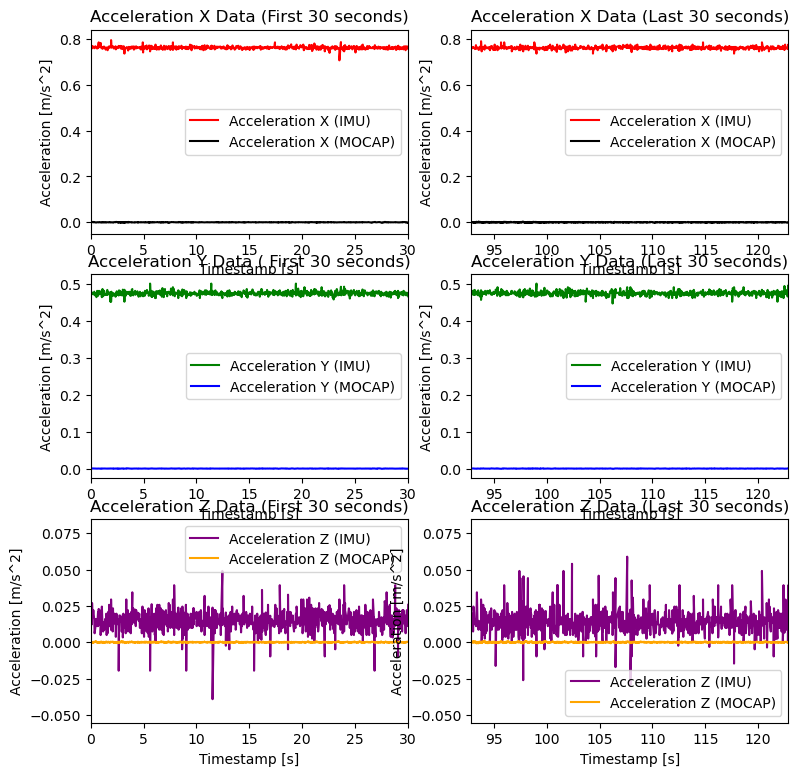

Processing folder: FORMATTED_DATA\data_front_01
IMU data loaded
MoCap data loaded


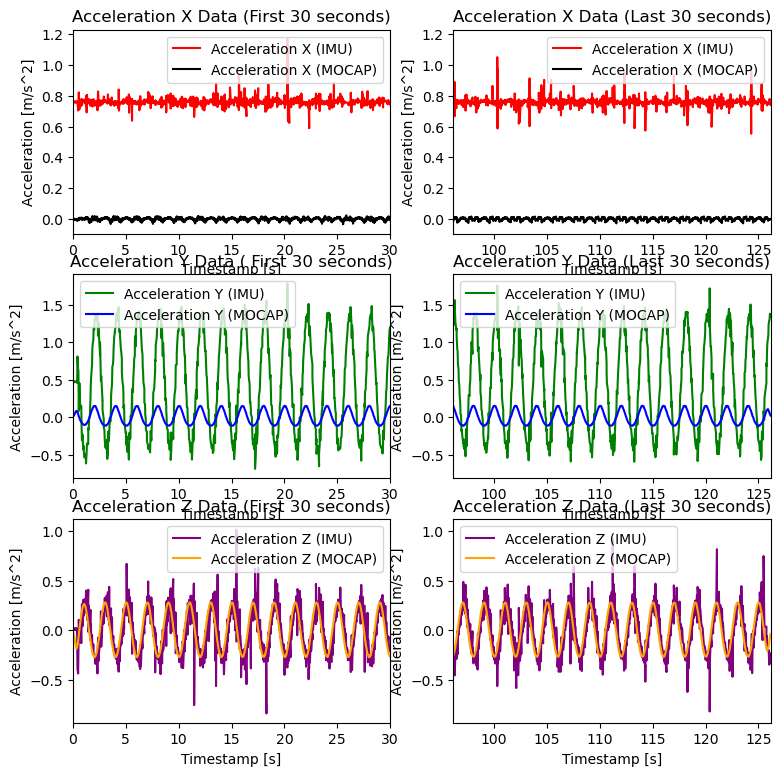

Processing folder: FORMATTED_DATA\data_front_02
IMU data loaded
MoCap data loaded


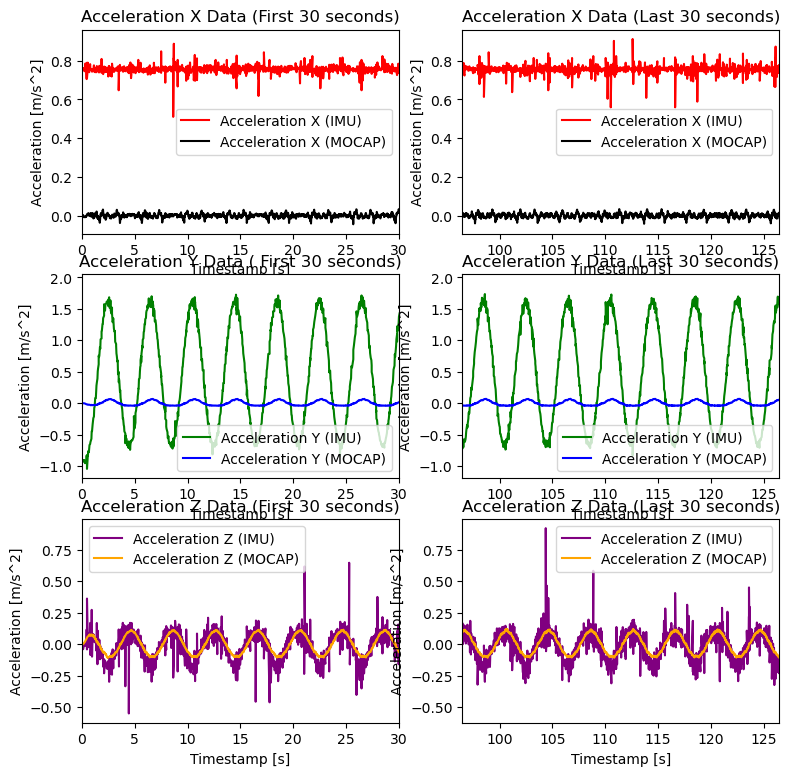

Processing folder: FORMATTED_DATA\data_front_03
IMU data loaded
MoCap data loaded


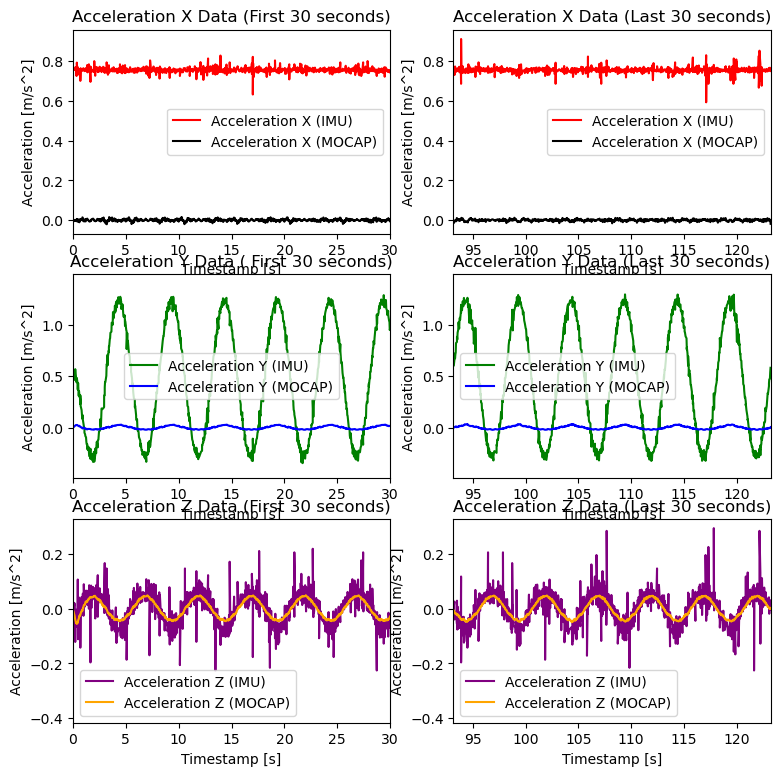

Processing folder: FORMATTED_DATA\data_front_04
IMU data loaded
MoCap data loaded


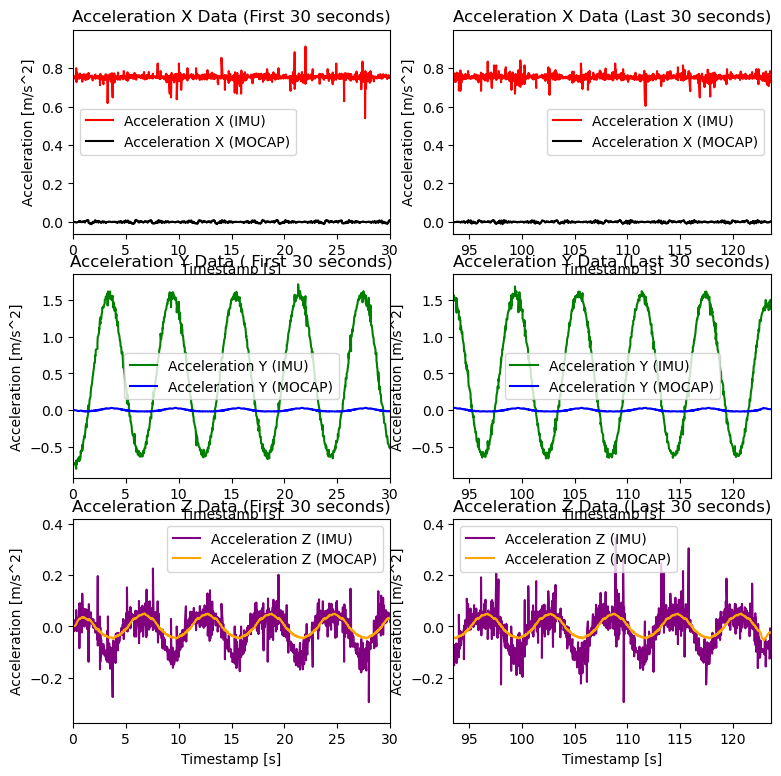

Processing folder: FORMATTED_DATA\data_front_05
IMU data loaded
MoCap data loaded


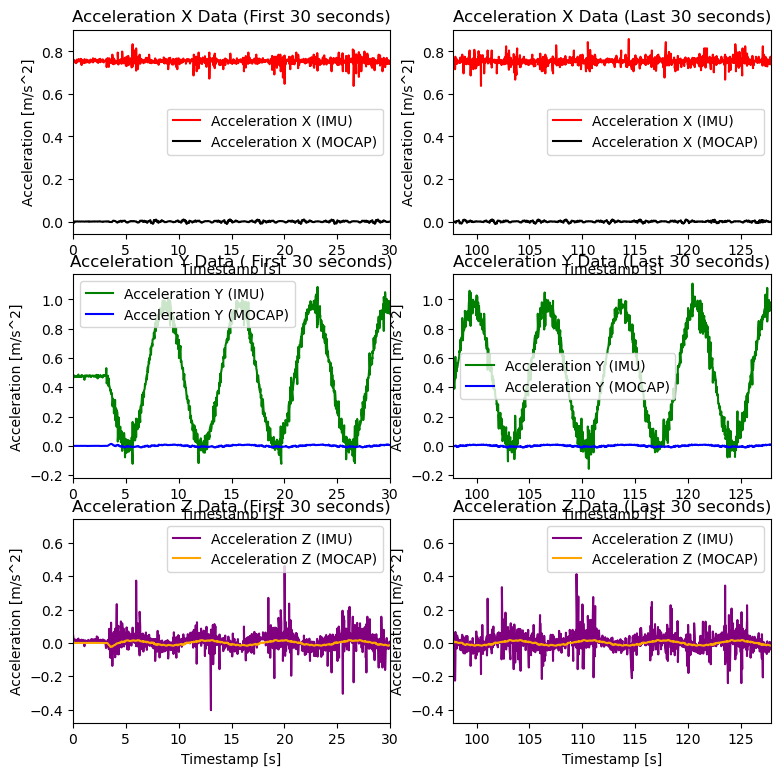

Processing folder: FORMATTED_DATA\data_front_06
IMU data loaded
MoCap data loaded


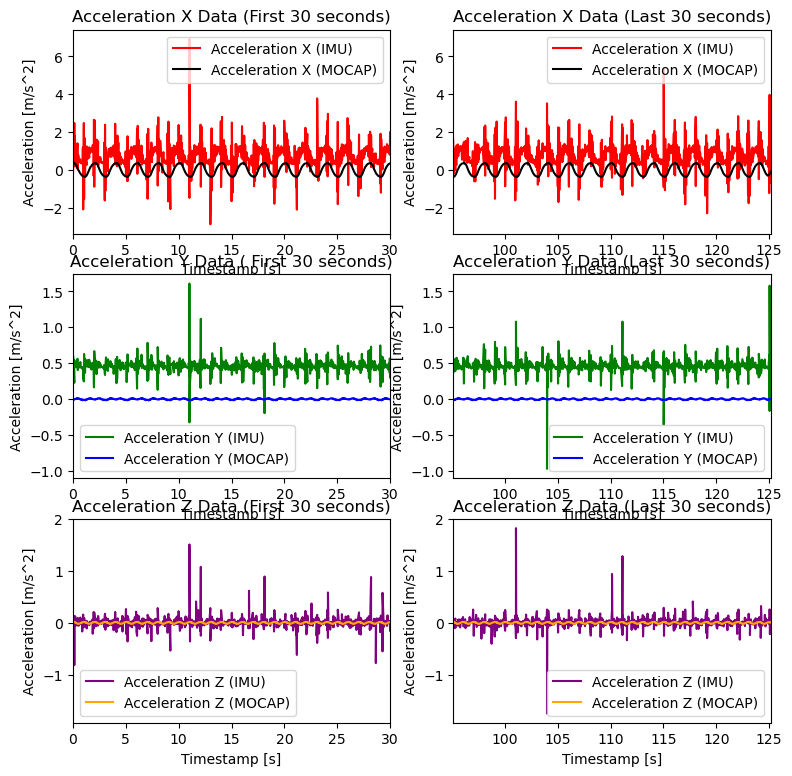

Processing folder: FORMATTED_DATA\data_front_07
IMU data loaded
MoCap data loaded


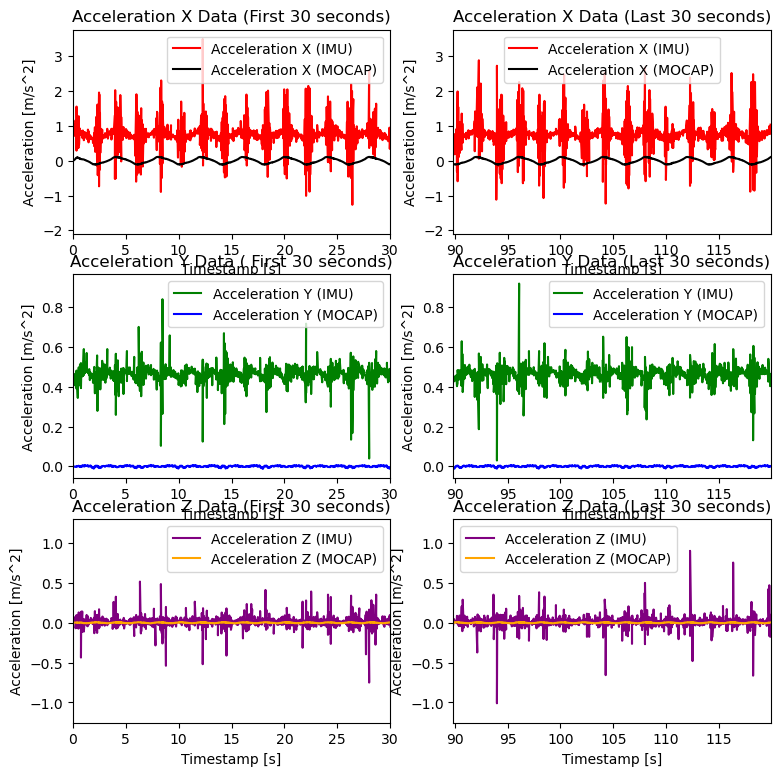

Processing folder: FORMATTED_DATA\data_front_08
IMU data loaded
MoCap data loaded


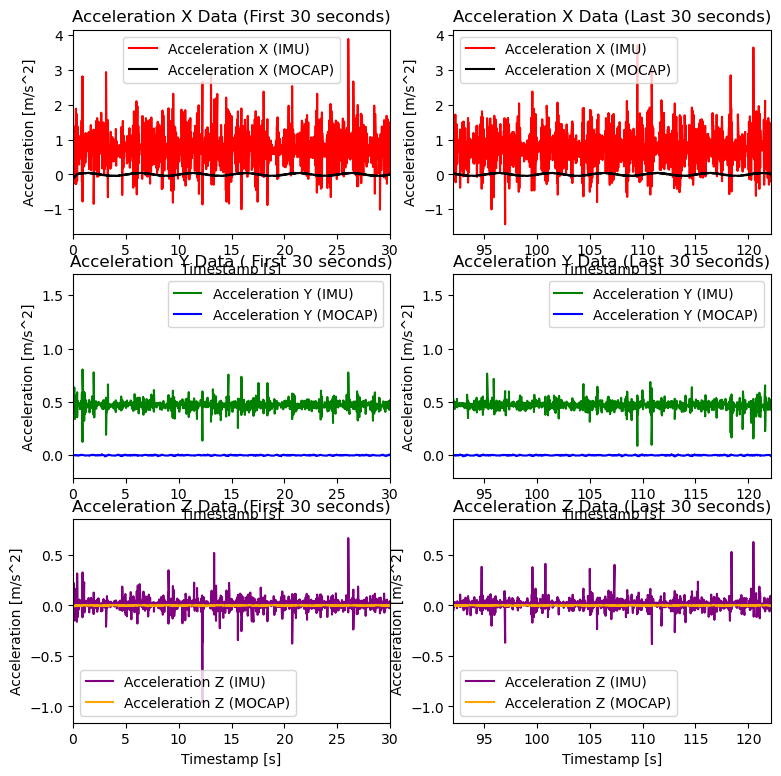

Processing folder: FORMATTED_DATA\data_front_09
IMU data loaded
MoCap data loaded


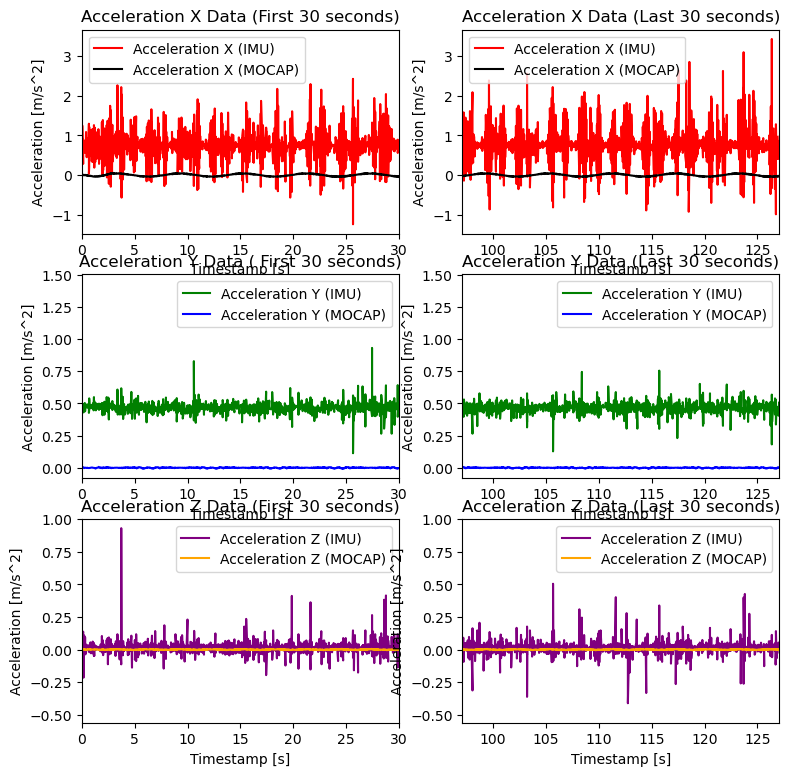

Processing folder: FORMATTED_DATA\data_front_10
IMU data loaded
MoCap data loaded


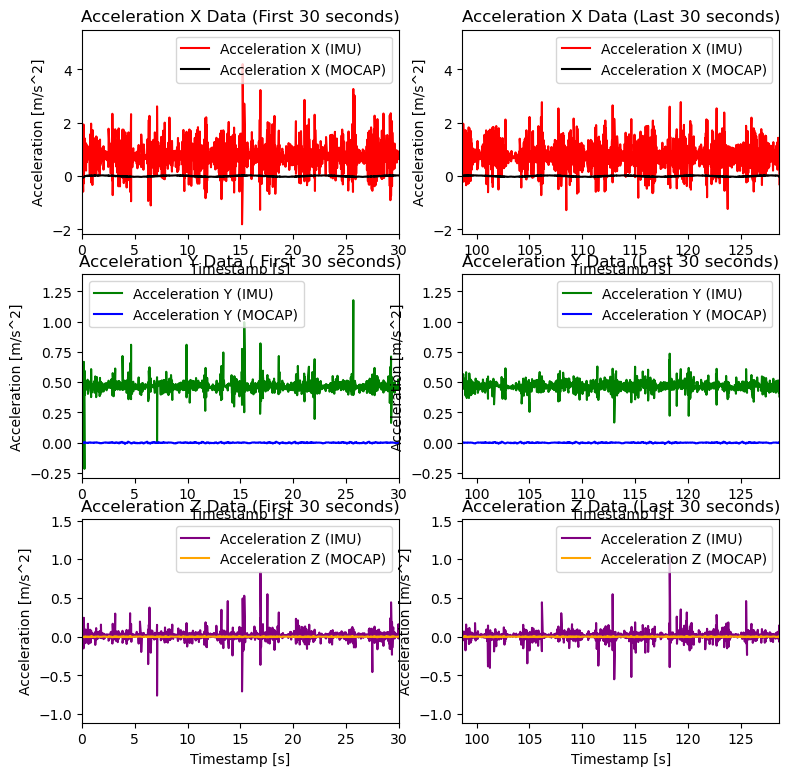

Processing folder: FORMATTED_DATA\data_front_11
IMU data loaded
MoCap data loaded


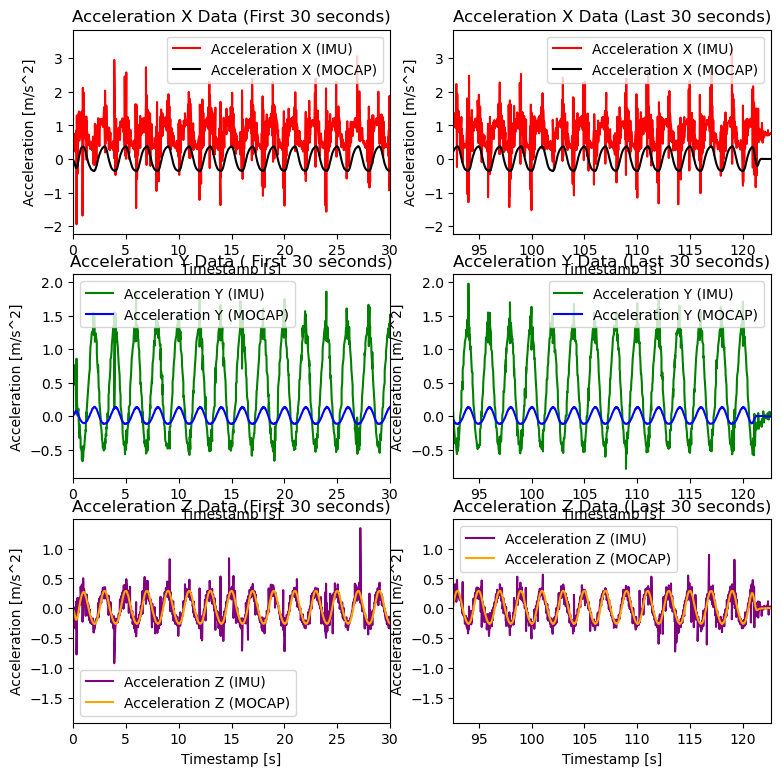

Processing folder: FORMATTED_DATA\data_front_12
IMU data loaded
MoCap data loaded


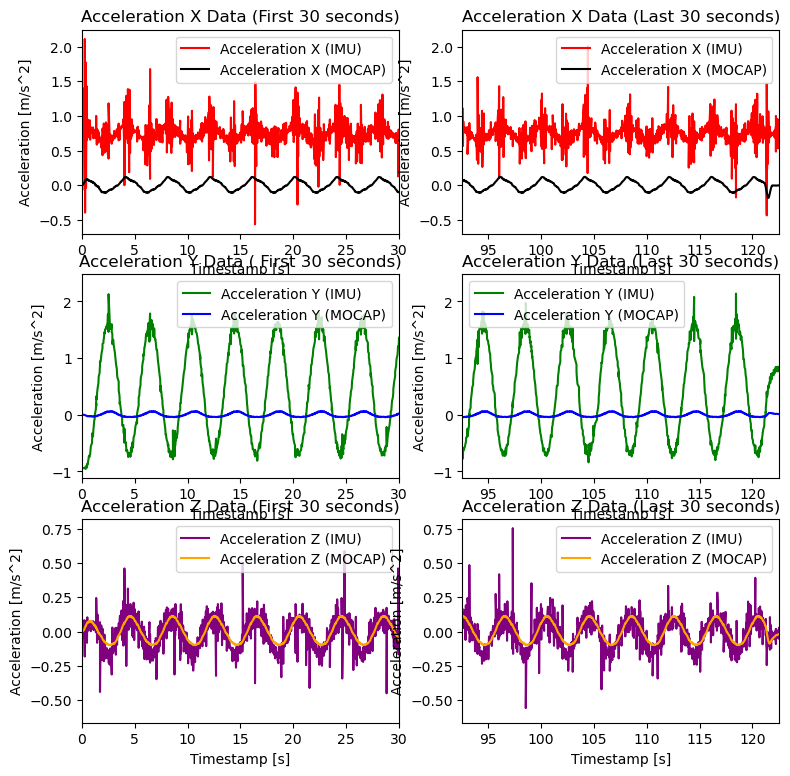

Processing folder: FORMATTED_DATA\data_front_13
IMU data loaded
MoCap data loaded


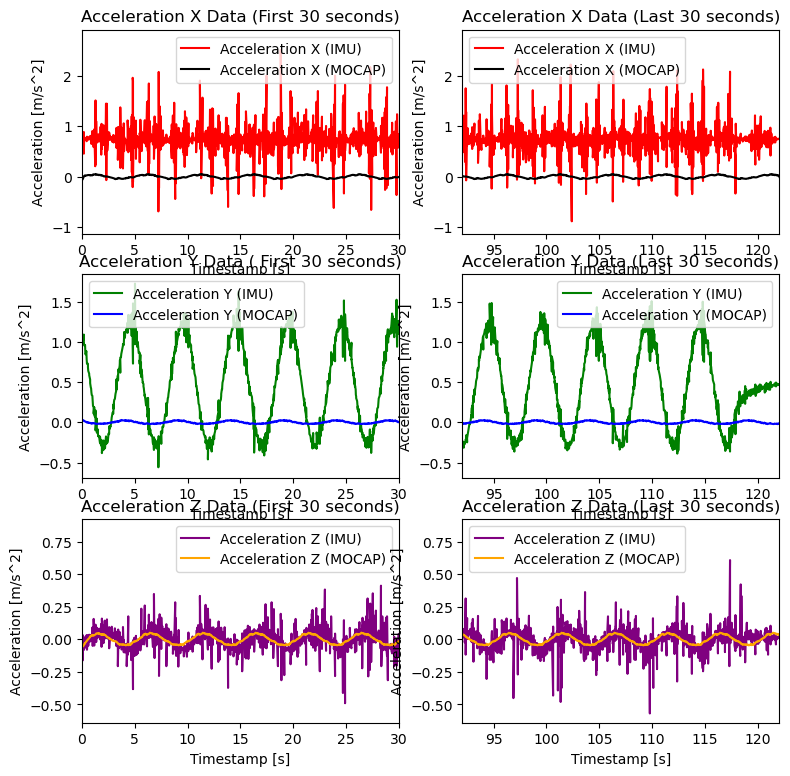

Processing folder: FORMATTED_DATA\data_front_14
IMU data loaded
MoCap data loaded


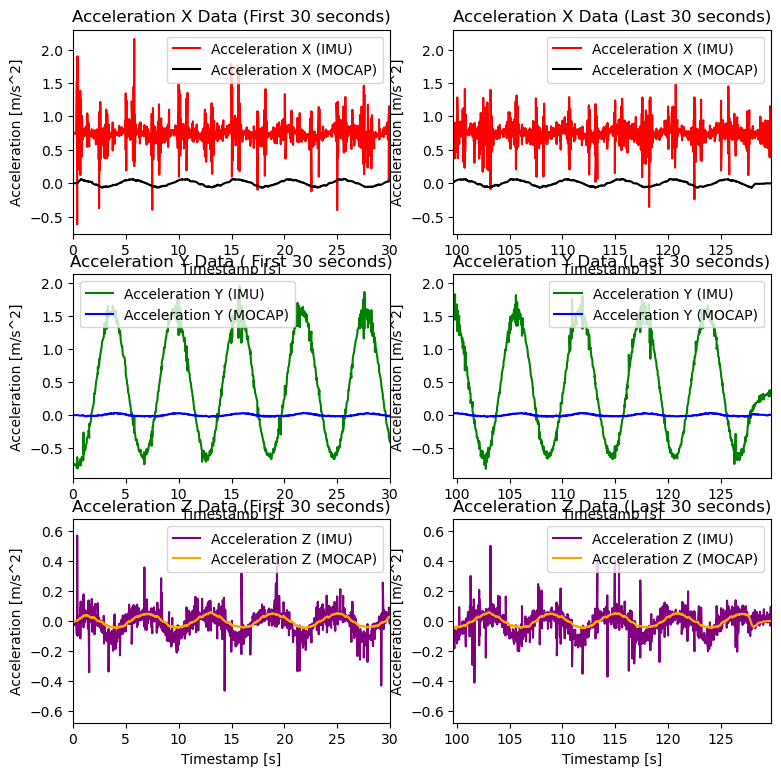

Processing folder: FORMATTED_DATA\data_front_15
IMU data loaded
MoCap data loaded


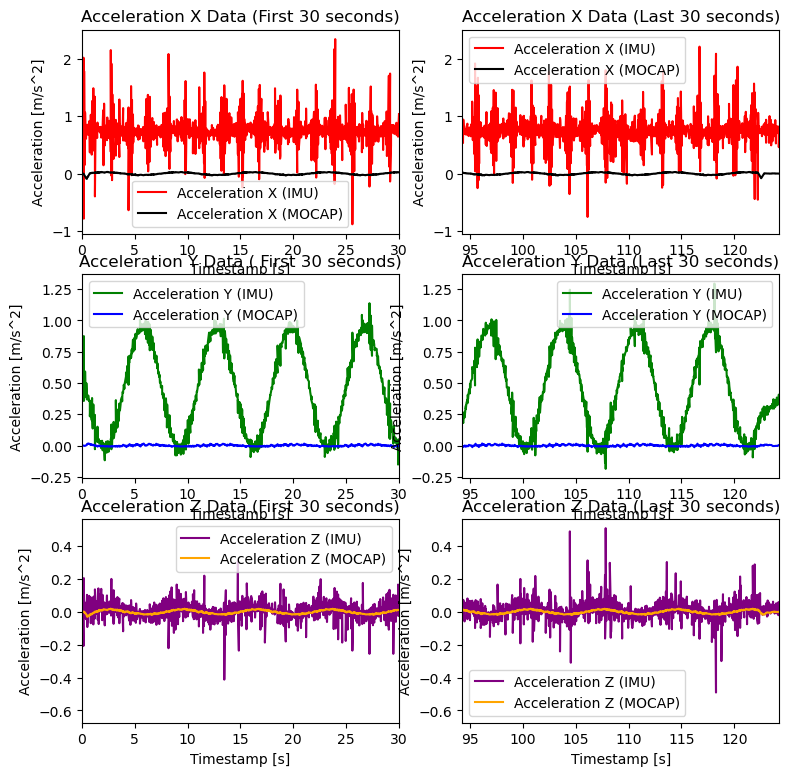

Processing folder: FORMATTED_DATA\data_left_rear_00
IMU data loaded
MoCap data loaded


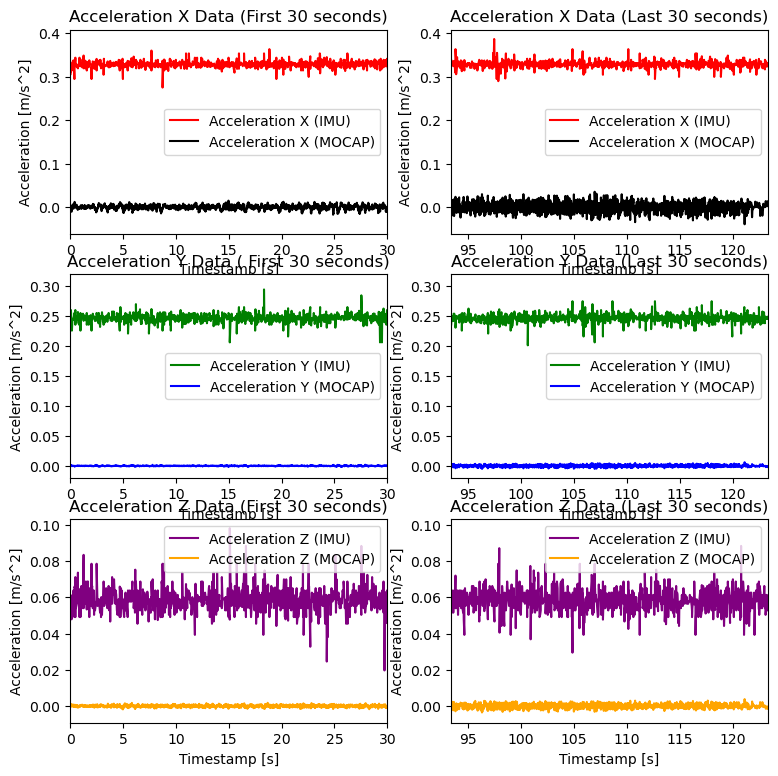

Processing folder: FORMATTED_DATA\data_left_rear_01
IMU data loaded
MoCap data loaded


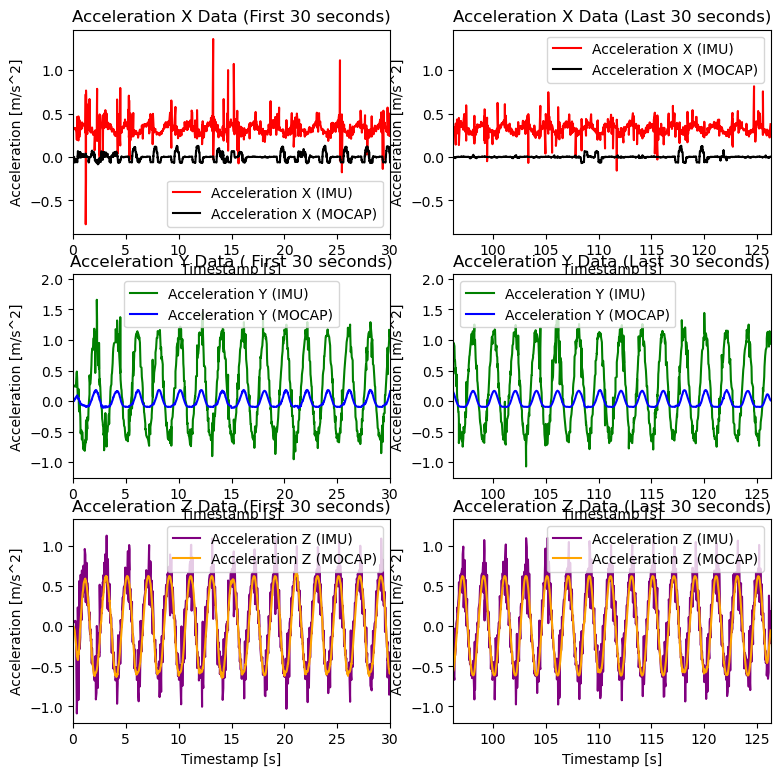

Processing folder: FORMATTED_DATA\data_left_rear_02
IMU data loaded
MoCap data loaded


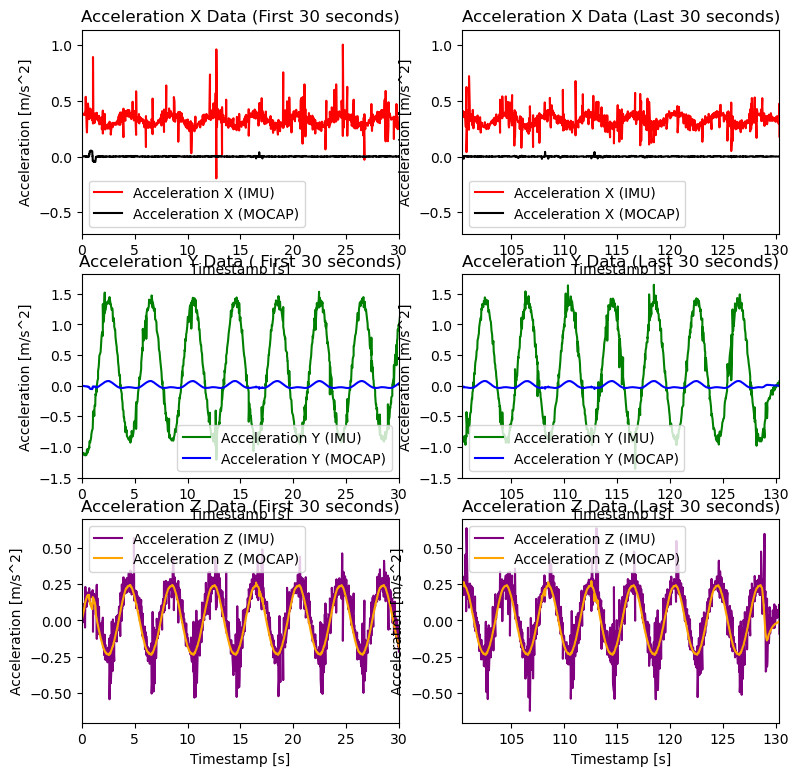

Processing folder: FORMATTED_DATA\data_left_rear_03
IMU data loaded
MoCap data loaded


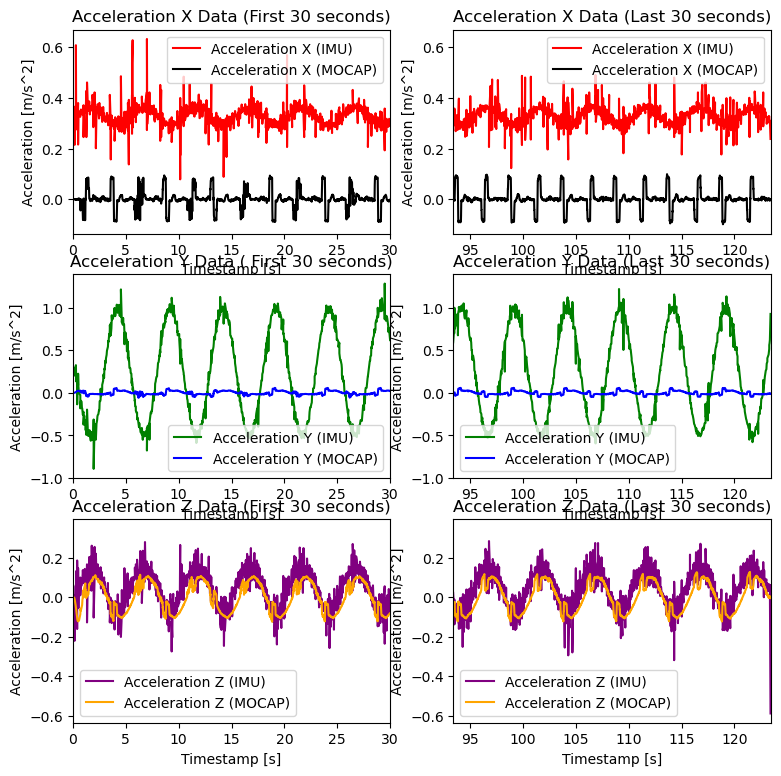

Processing folder: FORMATTED_DATA\data_left_rear_04
IMU data loaded
MoCap data loaded


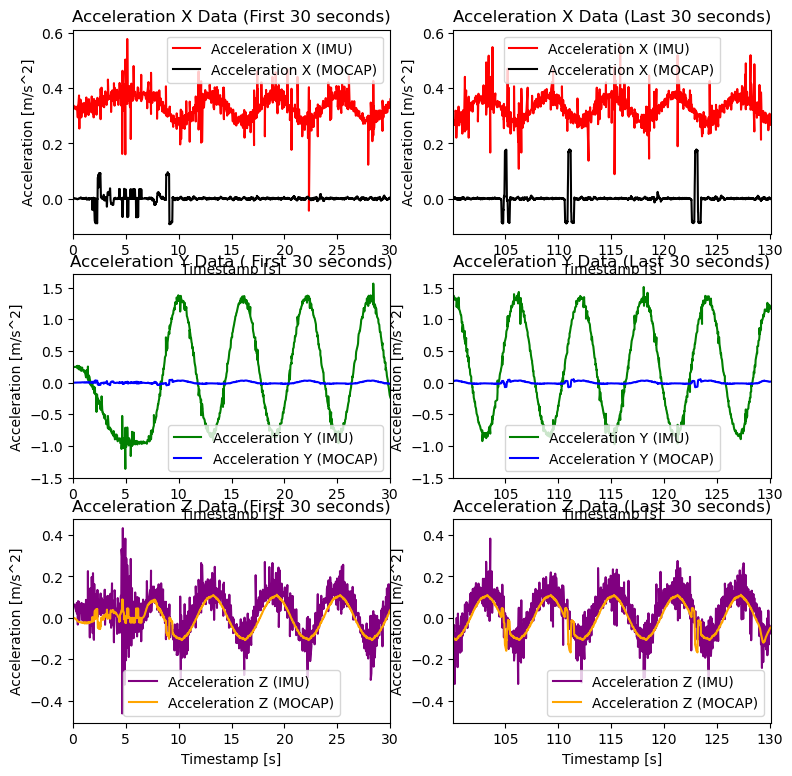

Processing folder: FORMATTED_DATA\data_left_rear_05
IMU data loaded
MoCap data loaded


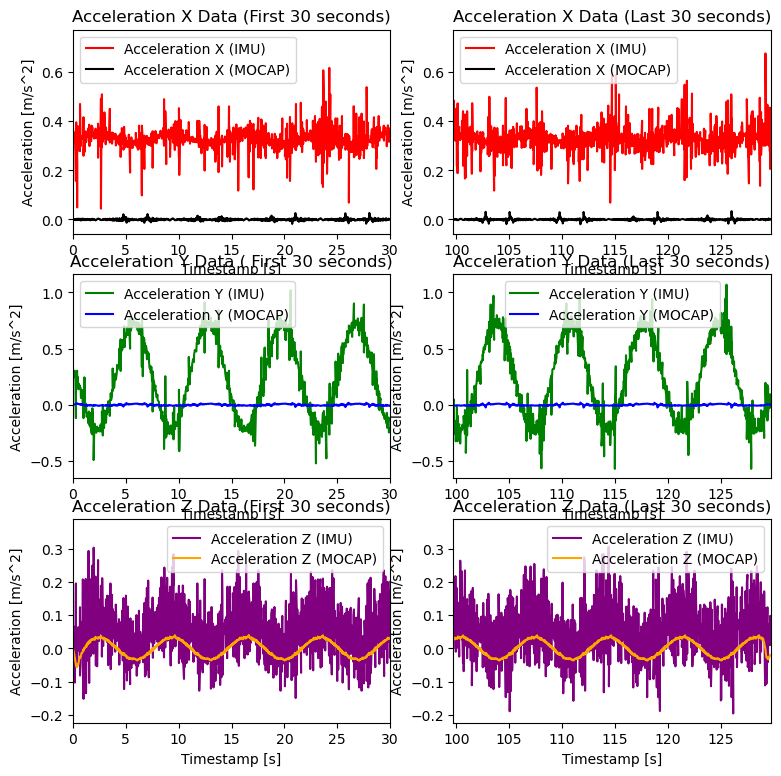

Processing folder: FORMATTED_DATA\data_left_rear_06
IMU data loaded
MoCap data loaded


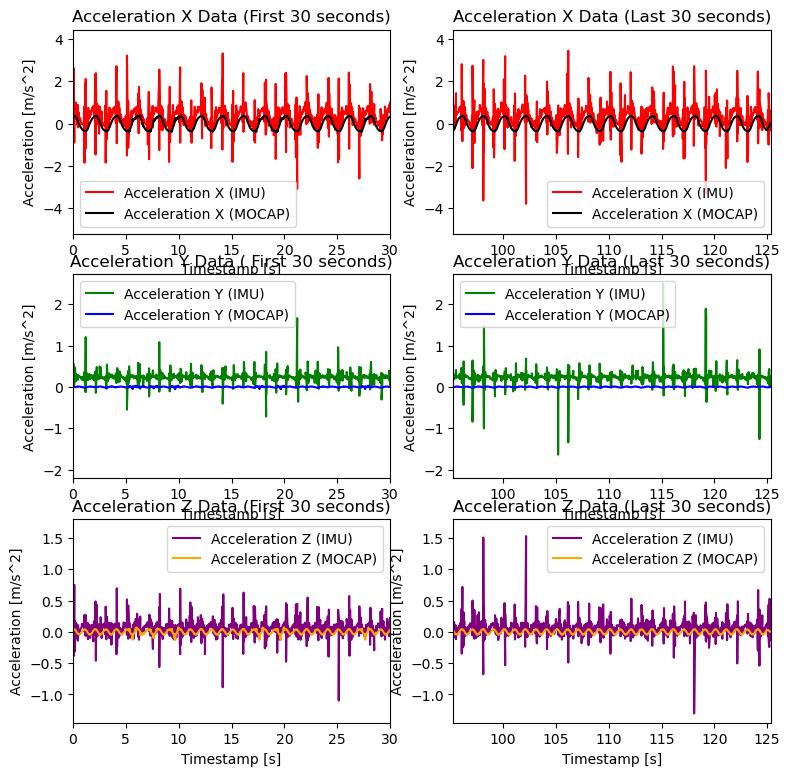

Processing folder: FORMATTED_DATA\data_left_rear_07
IMU data loaded
MoCap data loaded


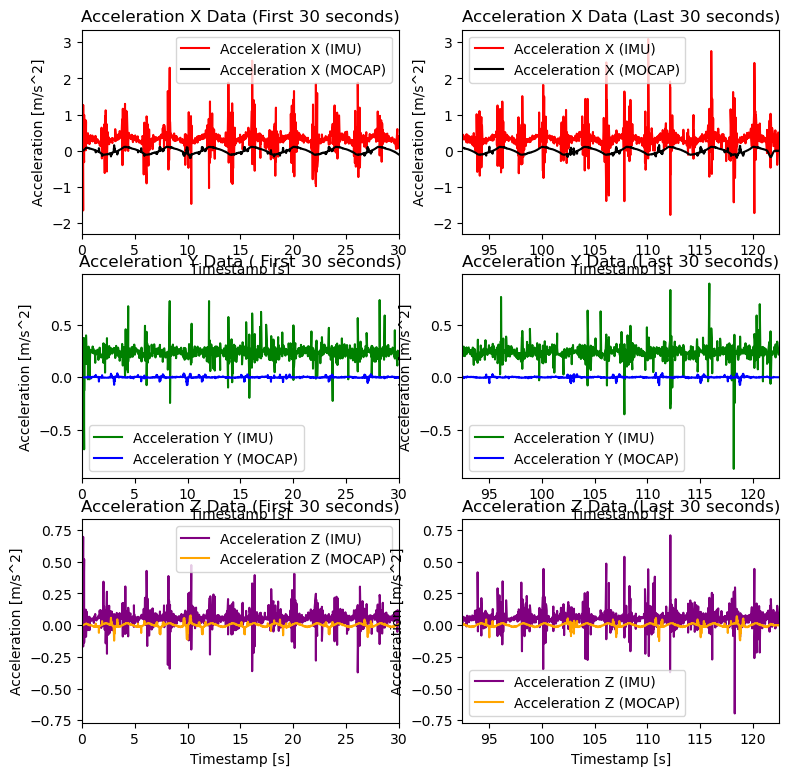

Processing folder: FORMATTED_DATA\data_left_rear_08
IMU data loaded
MoCap data loaded


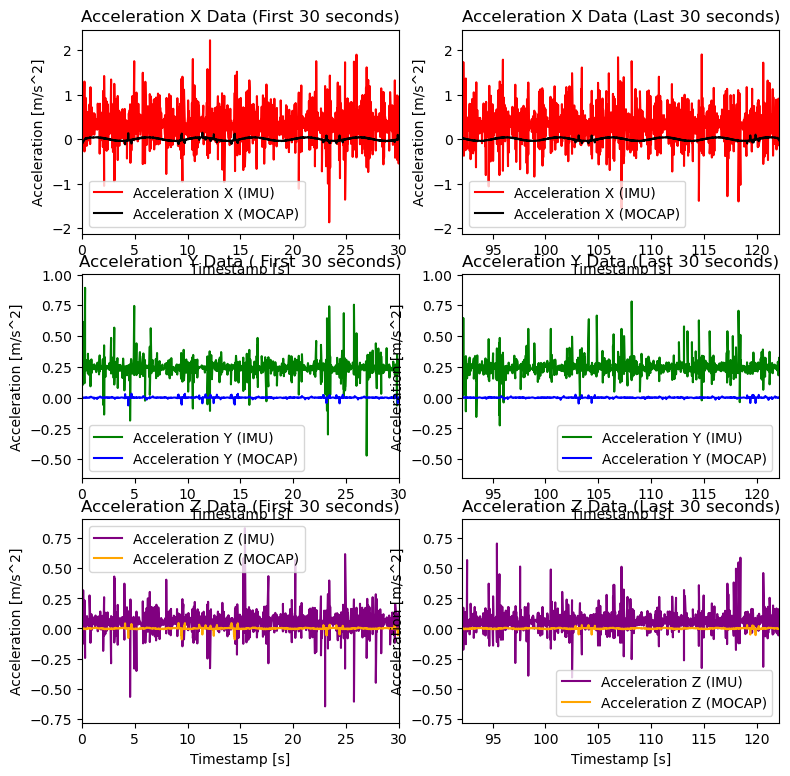

Processing folder: FORMATTED_DATA\data_left_rear_09
IMU data loaded
MoCap data loaded


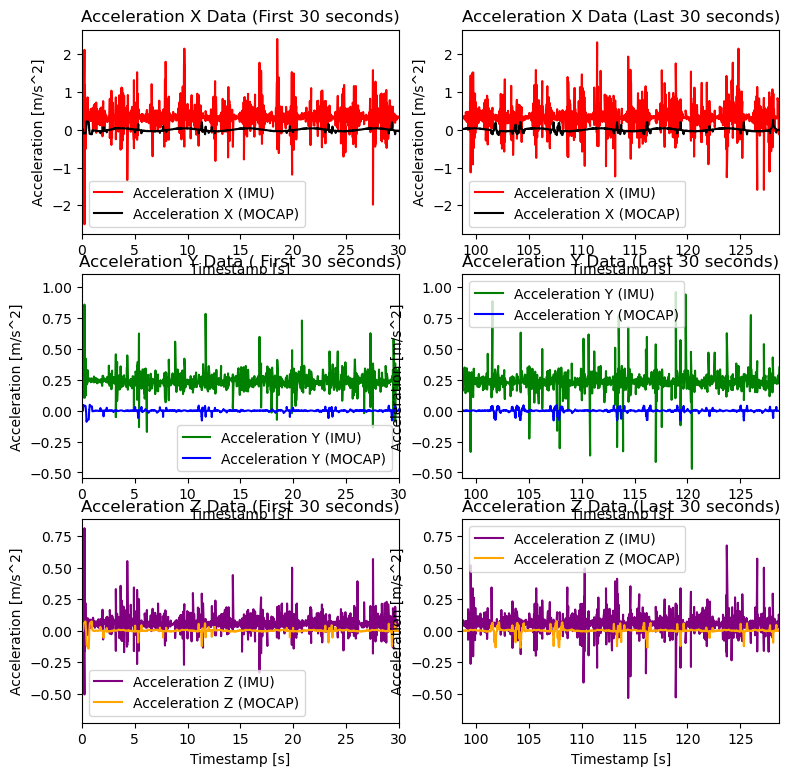

Processing folder: FORMATTED_DATA\data_left_rear_10
IMU data loaded
MoCap data loaded


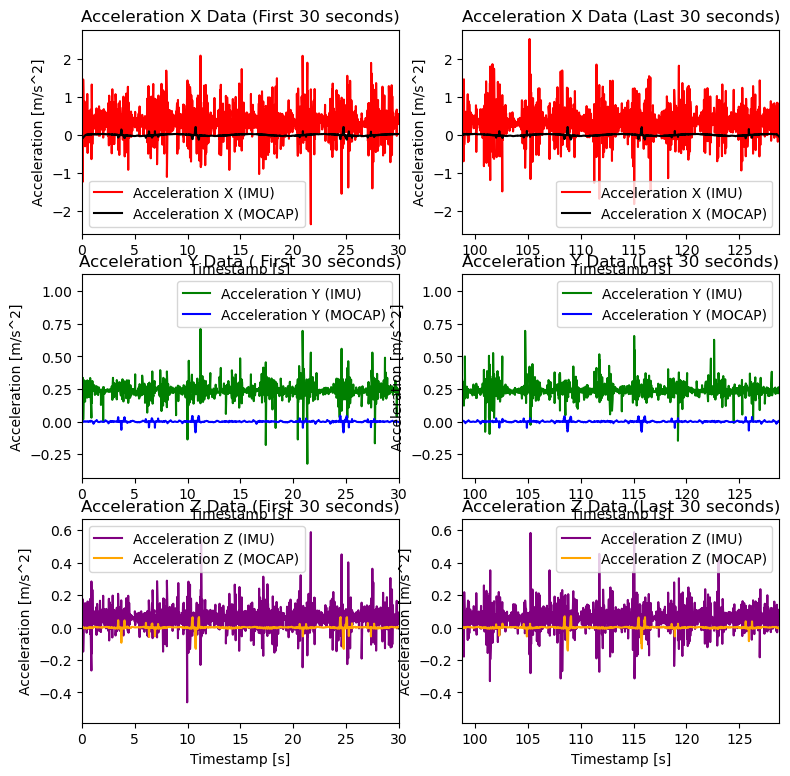

Processing folder: FORMATTED_DATA\data_left_rear_11
IMU data loaded
MoCap data loaded


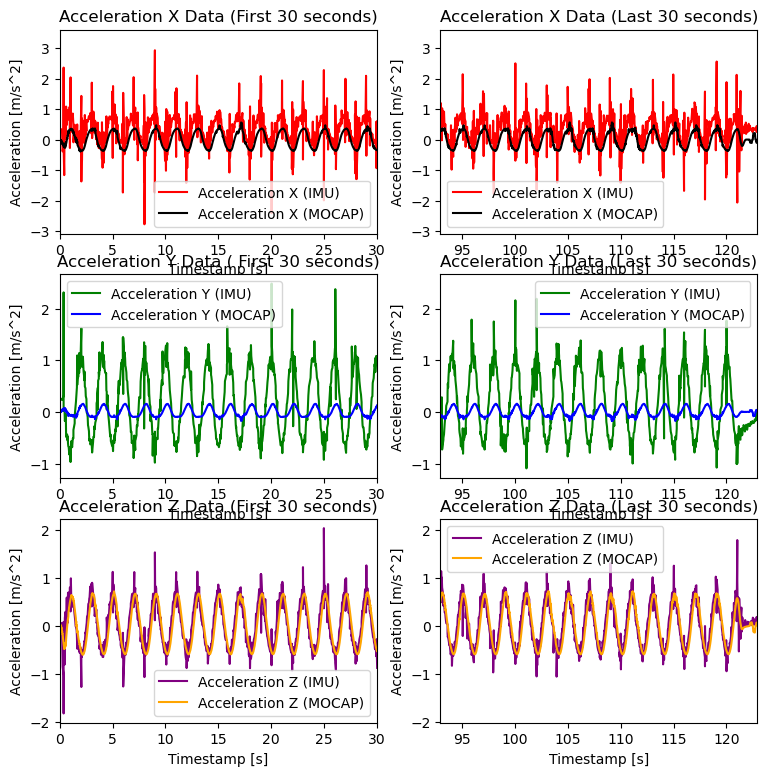

Processing folder: FORMATTED_DATA\data_left_rear_12
IMU data loaded
MoCap data loaded


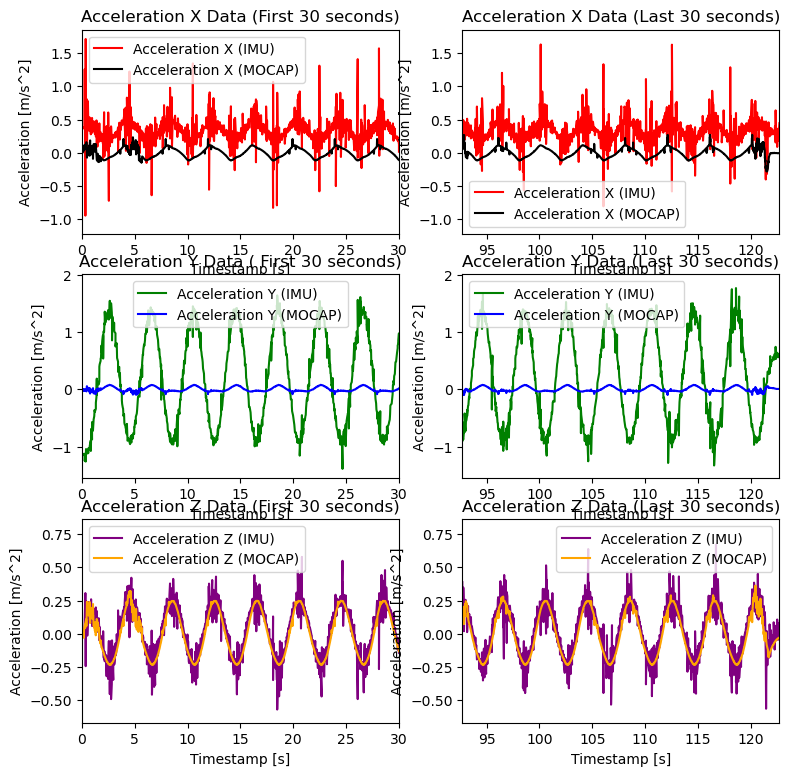

Processing folder: FORMATTED_DATA\data_left_rear_13
IMU data loaded
MoCap data loaded


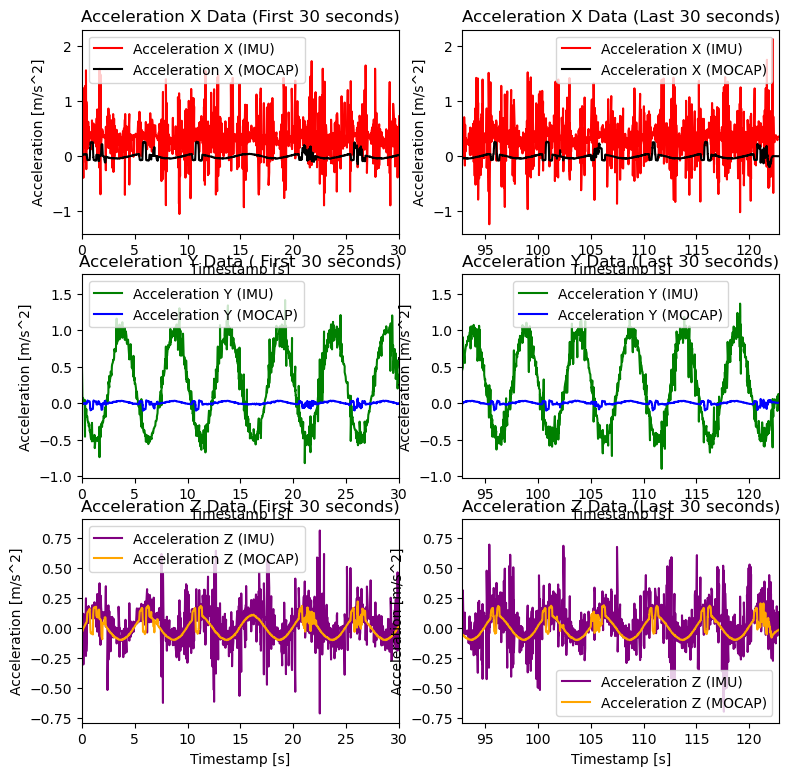

Processing folder: FORMATTED_DATA\data_left_rear_14
IMU data loaded
MoCap data loaded


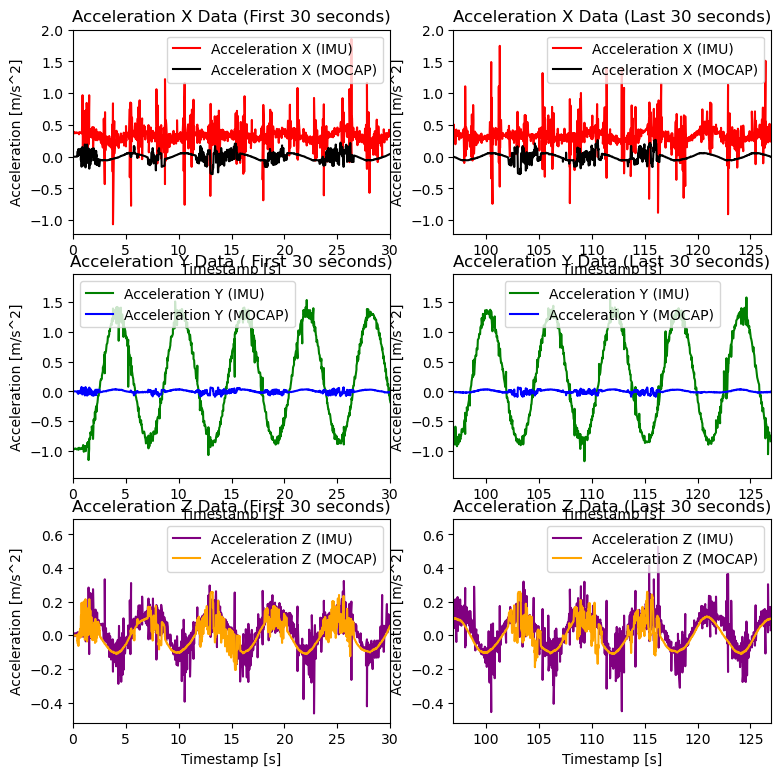

Processing folder: FORMATTED_DATA\data_left_rear_15
IMU data loaded
MoCap data loaded


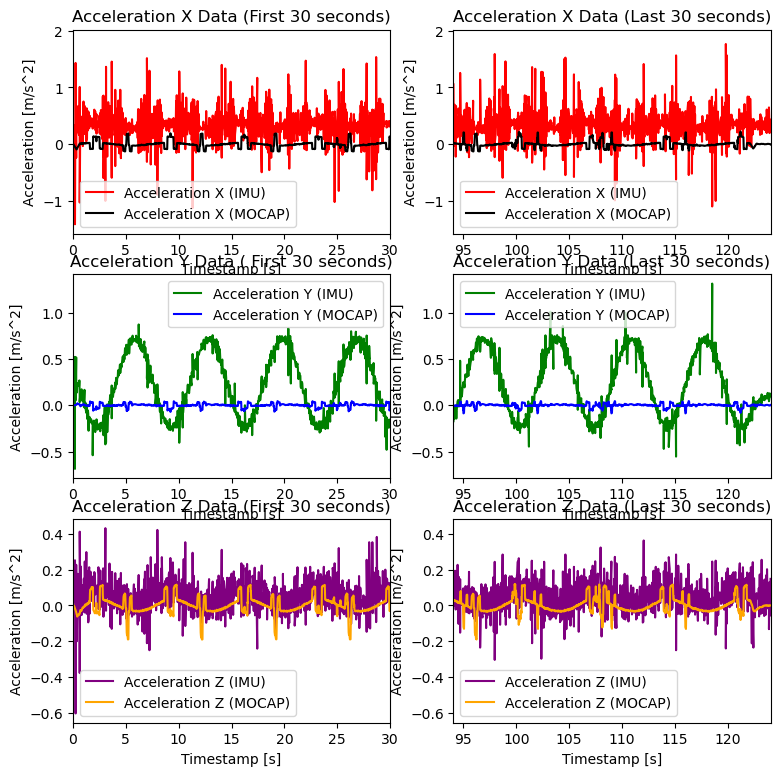

Processing folder: FORMATTED_DATA\data_right_rear_00
IMU data loaded
MoCap data loaded


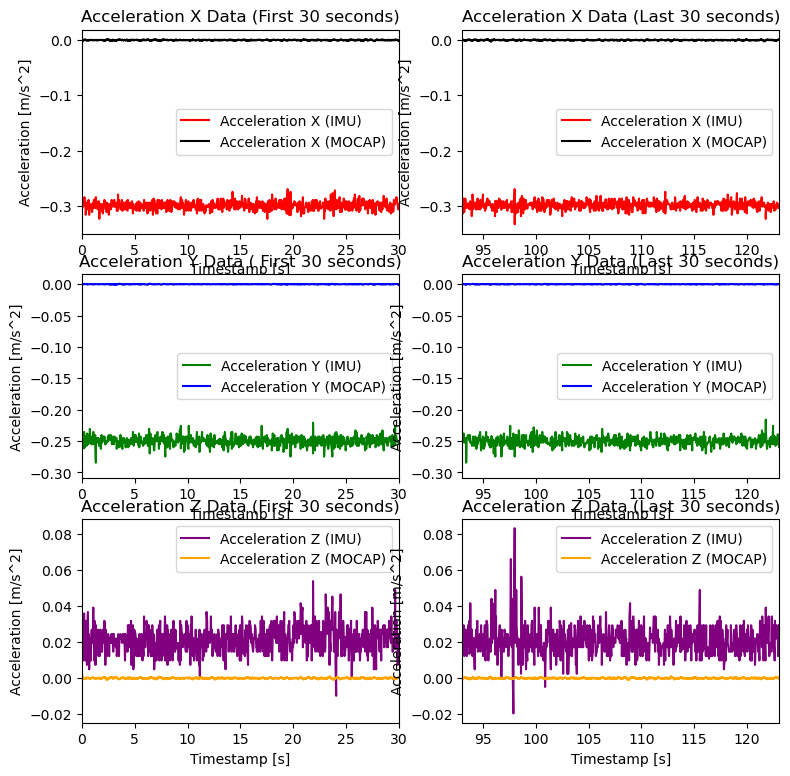

Processing folder: FORMATTED_DATA\data_right_rear_01
IMU data loaded
MoCap data loaded


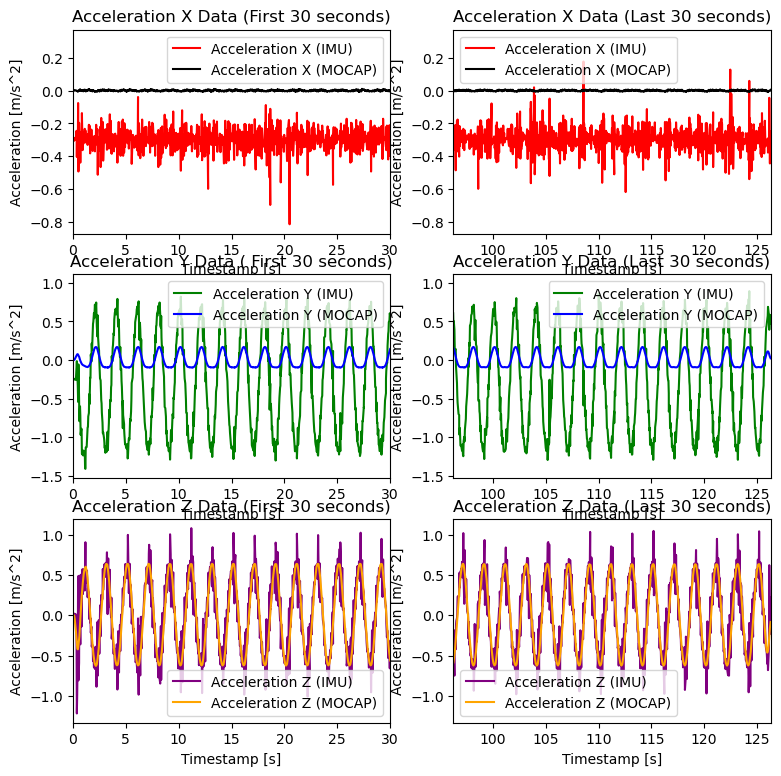

Processing folder: FORMATTED_DATA\data_right_rear_02
IMU data loaded
MoCap data loaded


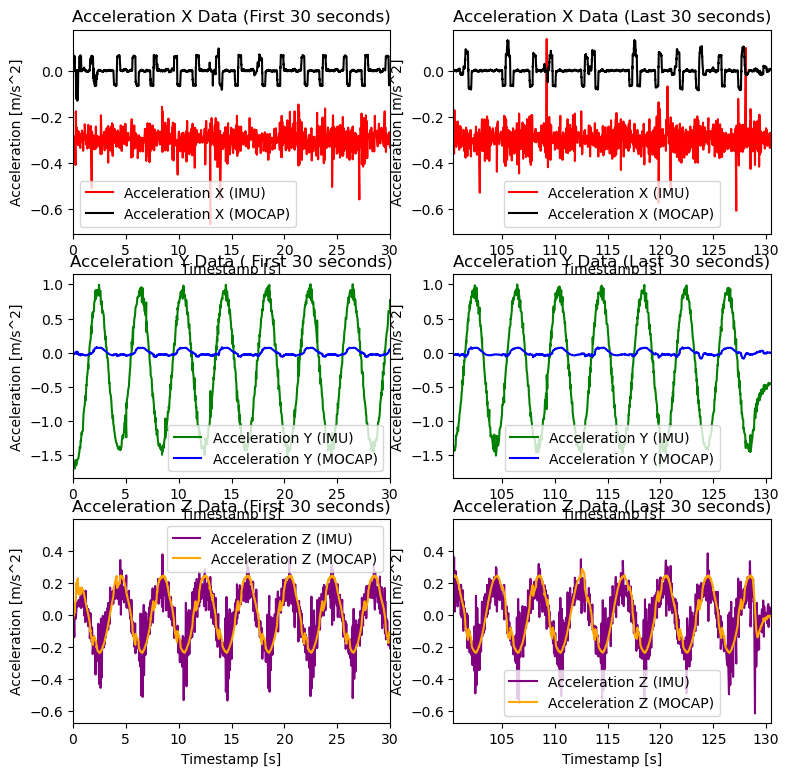

Processing folder: FORMATTED_DATA\data_right_rear_03
IMU data loaded
MoCap data loaded


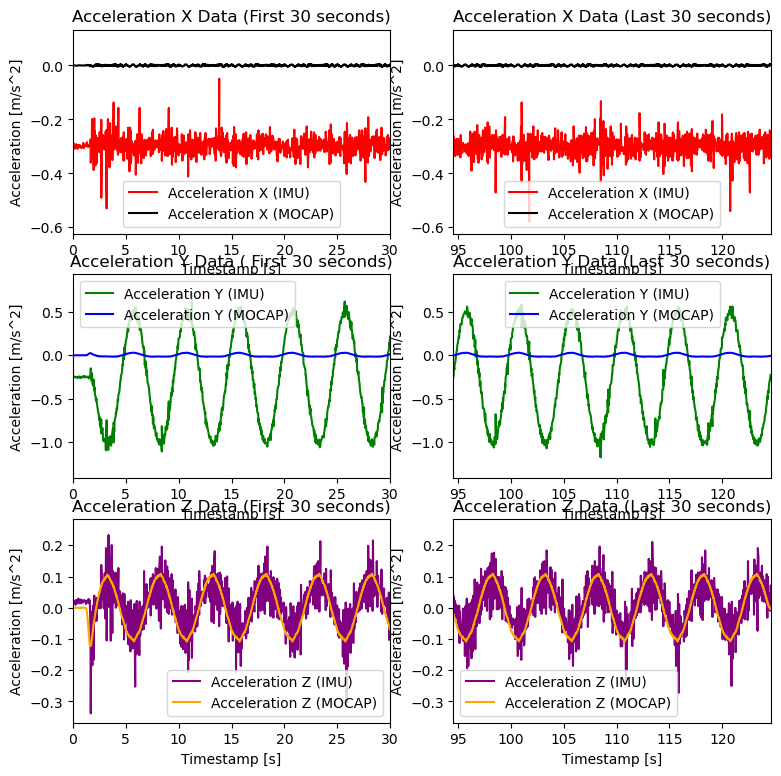

Processing folder: FORMATTED_DATA\data_right_rear_04
IMU data loaded
MoCap data loaded


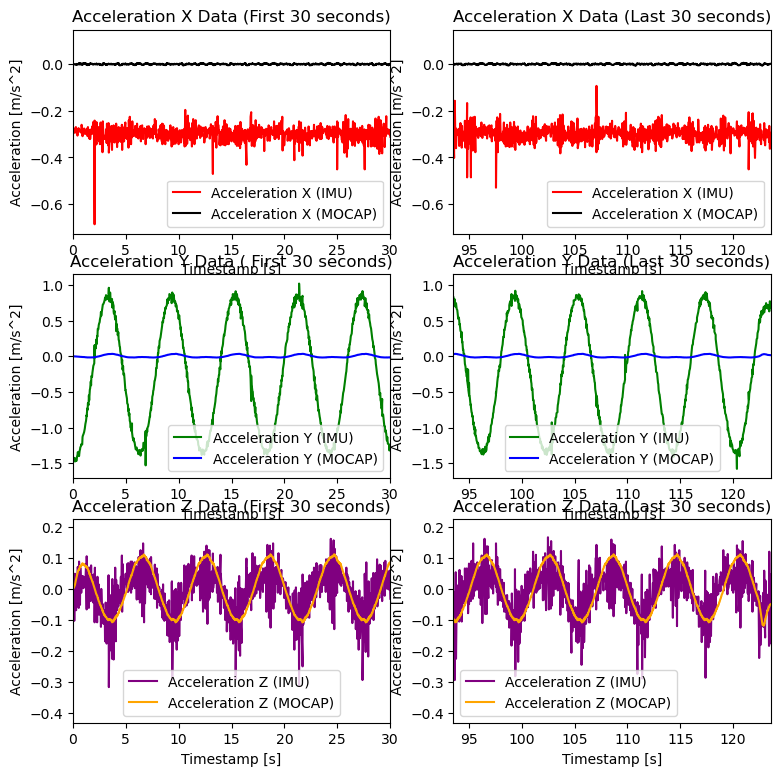

Processing folder: FORMATTED_DATA\data_right_rear_05
IMU data loaded
MoCap data loaded


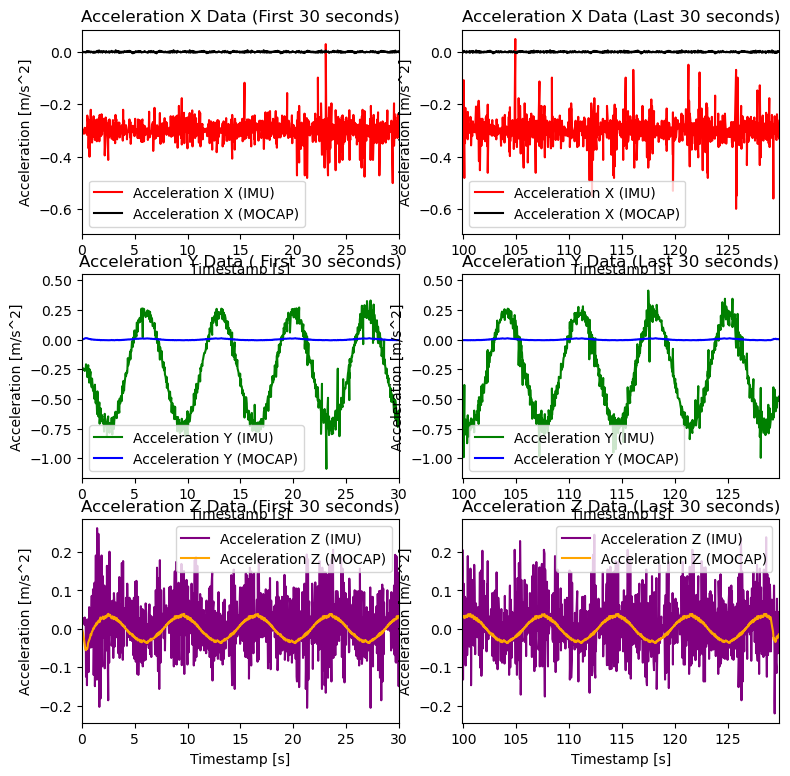

Processing folder: FORMATTED_DATA\data_right_rear_06
IMU data loaded
MoCap data loaded


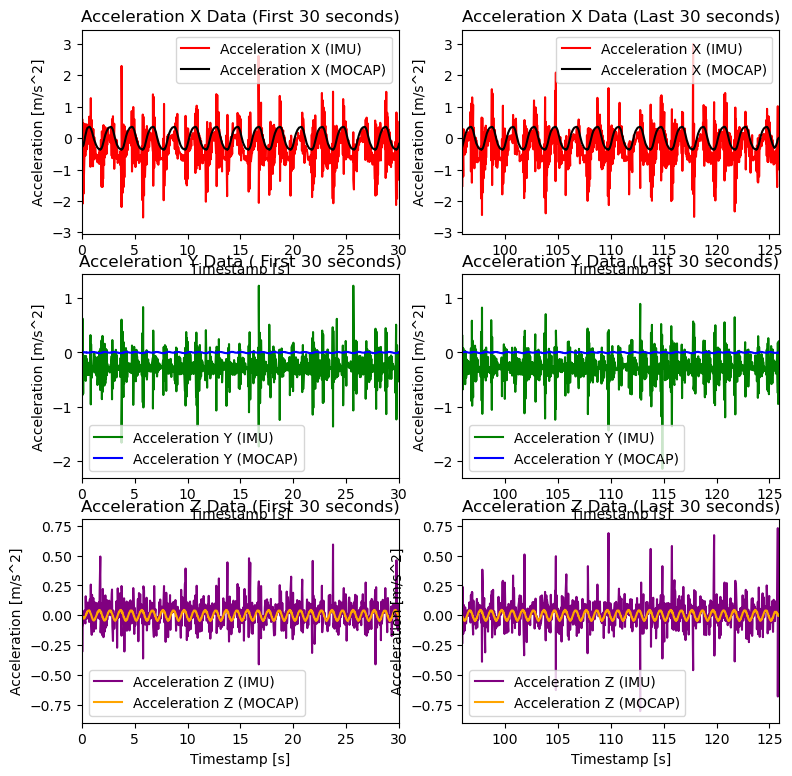

Processing folder: FORMATTED_DATA\data_right_rear_07
IMU data loaded
MoCap data loaded


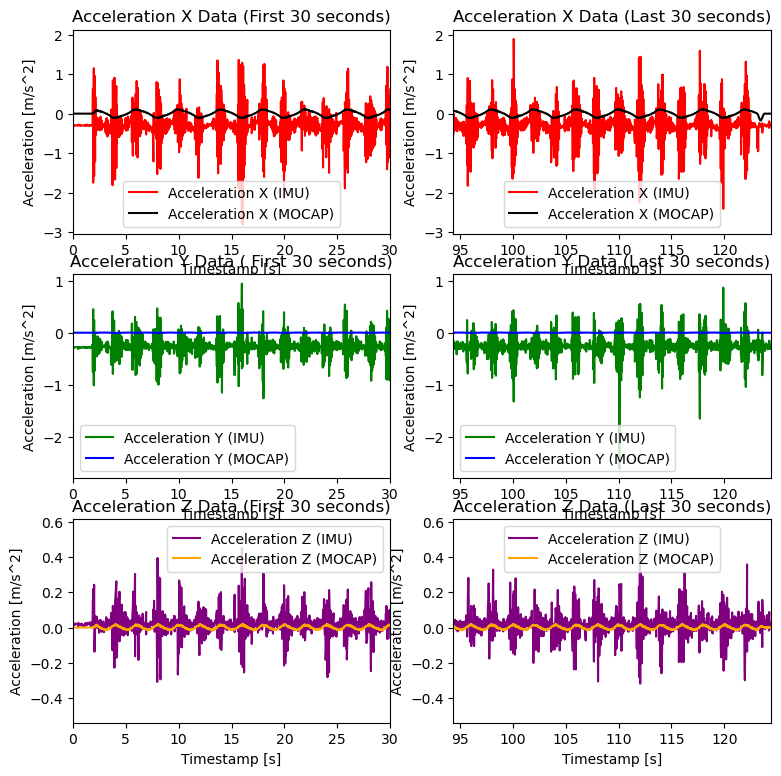

Processing folder: FORMATTED_DATA\data_right_rear_08
IMU data loaded
MoCap data loaded


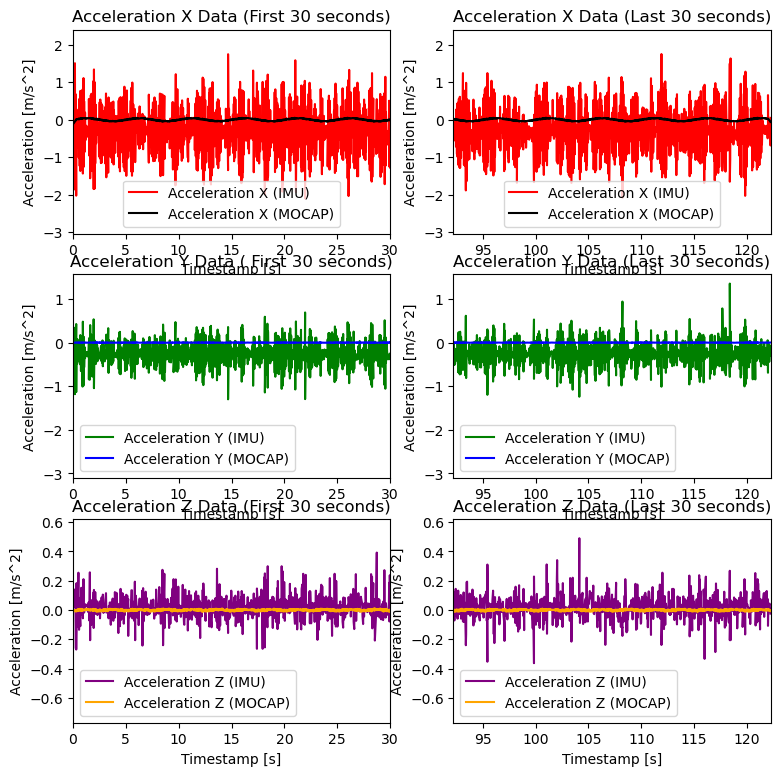

Processing folder: FORMATTED_DATA\data_right_rear_09
IMU data loaded
MoCap data loaded


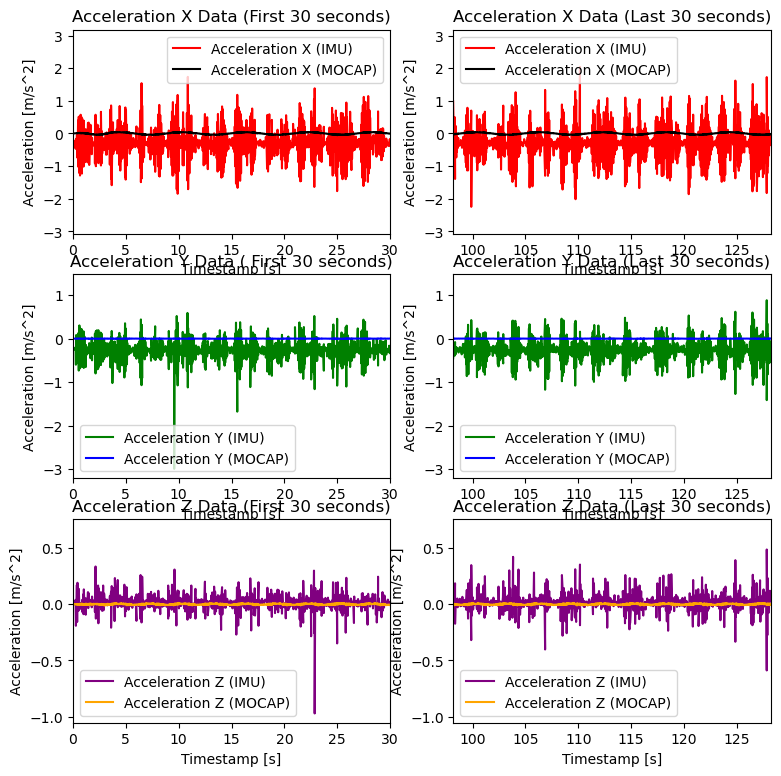

Processing folder: FORMATTED_DATA\data_right_rear_10
IMU data loaded
MoCap data loaded


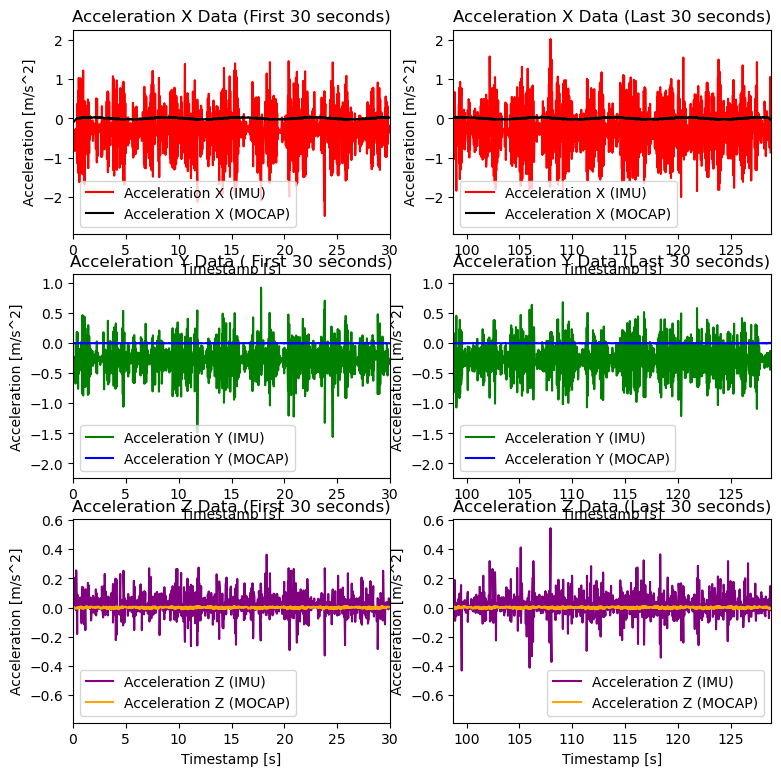

Processing folder: FORMATTED_DATA\data_right_rear_11
IMU data loaded
MoCap data loaded


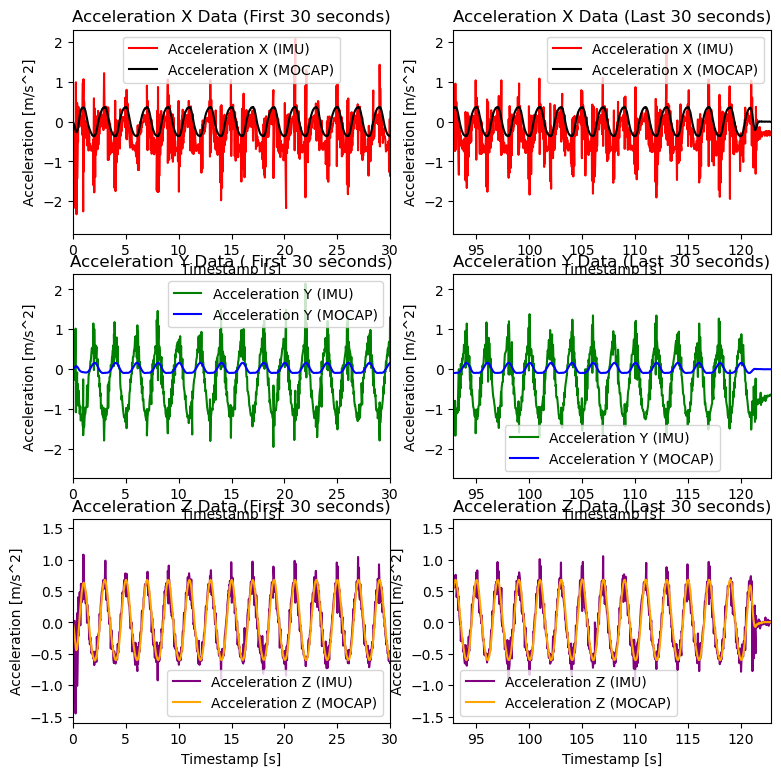

Processing folder: FORMATTED_DATA\data_right_rear_12
IMU data loaded
MoCap data loaded


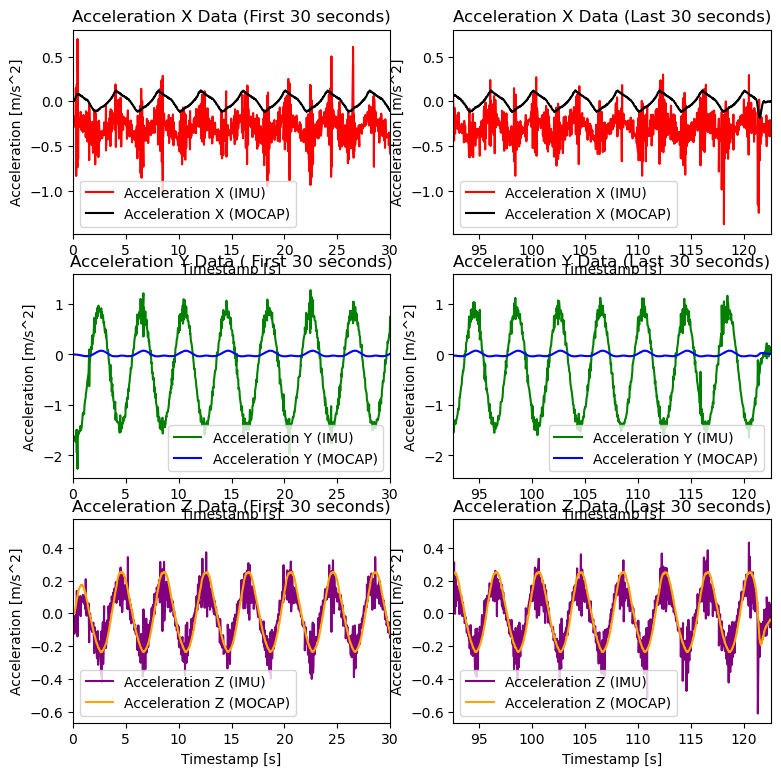

Processing folder: FORMATTED_DATA\data_right_rear_13
IMU data loaded
MoCap data loaded


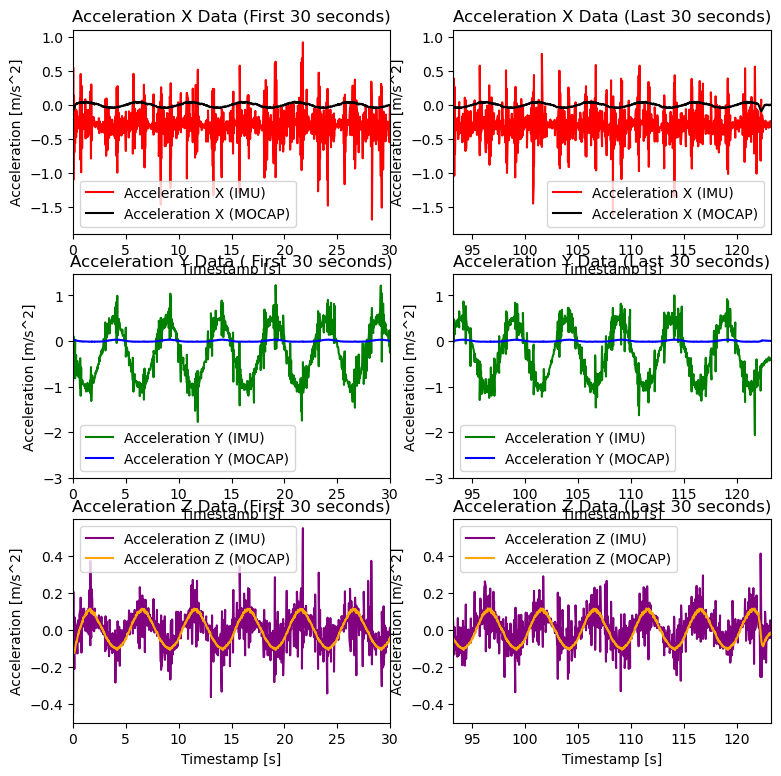

Processing folder: FORMATTED_DATA\data_right_rear_14
IMU data loaded
MoCap data loaded


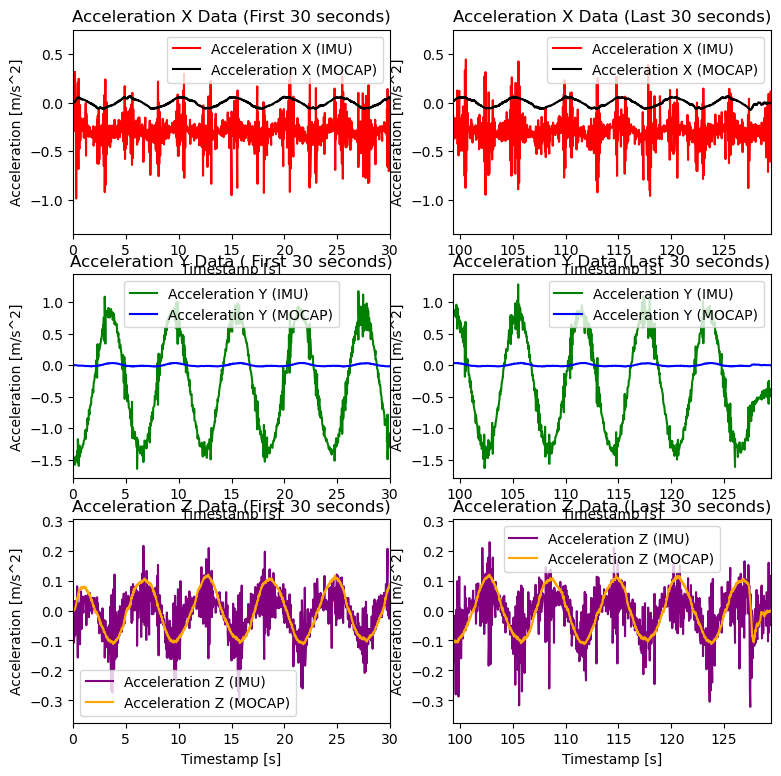

Processing folder: FORMATTED_DATA\data_right_rear_15
IMU data loaded
MoCap data loaded


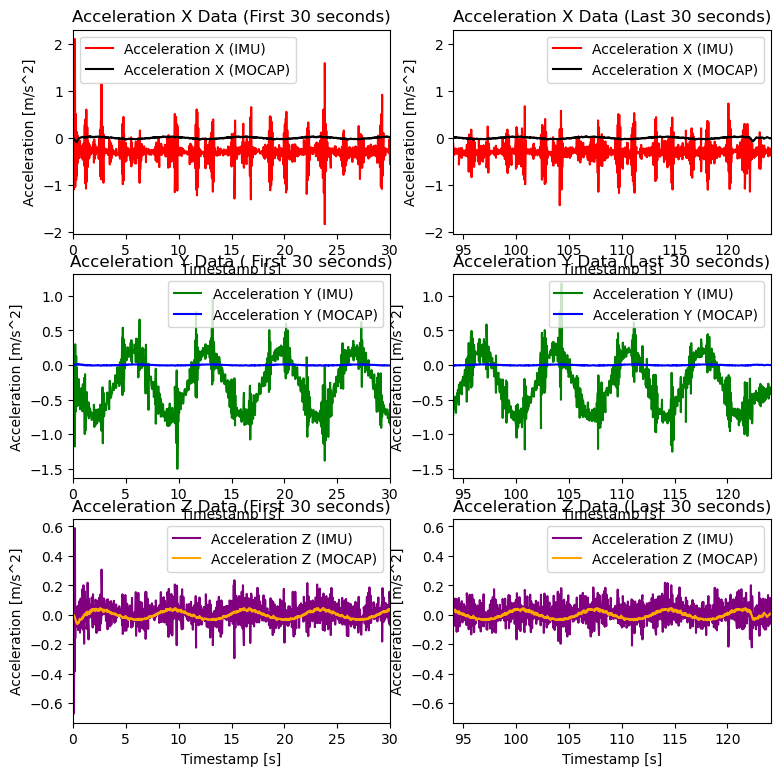

In [6]:

for root, dirs, files in os.walk(formatted_data_folder):
    for dir in dirs:
        current_folder = os.path.join(root, dir)
        print(f"Processing folder: {current_folder}")

        # Construct file paths
        imu_file_path = os.path.join(current_folder, imu_file)
        mocap_file_path = os.path.join(current_folder, mocap_file)

        # Read IMU data
        if os.path.exists(imu_file_path):
            imu_data = pd.read_csv(imu_file_path)
            print("IMU data loaded")

        # Read MoCap data
        if os.path.exists(mocap_file_path):
            mocap_data = np.load(mocap_file_path)
            print("MoCap data loaded")

        time_imu = imu_data.iloc[:, 0]
        time_imu_modified = (time_imu - time_imu.iloc[0]) / 1e9  # Convert to seconds
        accel_x_imu = imu_data.iloc[:, 5]
        accel_y_imu = imu_data.iloc[:, 6]
        accel_z_imu = imu_data.iloc[:, 7] - 9.81  # Correct for gravity

        time_mocap = mocap_data[:, 0]
        time_mocap_modified = (time_mocap - time_mocap[0]) / 1e6  # Convert to seconds
        accel_x_mocap = mocap_data[:, 4]
        accel_y_mocap = mocap_data[:, 5]
        accel_z_mocap = mocap_data[:, 6]
        
        # Assuming imu_data is a Pandas DataFrame
        time_imu = imu_data.iloc[:, 0]  # First column (timestamp [ns])
        time_imu_modified = (time_imu - time_imu.iloc[0]) / 1e9
        accel_x_imu = imu_data.iloc[:, 5]  # (acceleration x-axis)
        accel_y_imu = imu_data.iloc[:, 6]  # (acceleration y-axis)
        accel_z_imu = imu_data.iloc[:, 7] - 9.81  # (acceleration z-axis)

        # Assuming mocap_data is a NumPy array
        time_mocap = mocap_data[:, 0]
        time_mocap_modified = (time_mocap - time_mocap[0]) / 1e6
        accel_x_mocap = mocap_data[:, 4]  # (acceleration x-axis)
        accel_y_mocap = mocap_data[:, 5]  # (acceleration y-axis)
        accel_z_mocap = mocap_data[:, 6]  # (acceleration z-axis)

        fig, axs = plt.subplots(3, 2, figsize=(9, 9))

        # Plot the first 30 seconds
        axs[0, 0].plot(time_imu_modified, accel_x_imu, label='Acceleration X (IMU)', color='red')
        axs[0, 0].plot(time_mocap_modified, accel_x_mocap, label='Acceleration X (MOCAP)', color='black')
        axs[0, 0].set_title('Acceleration X Data (First 30 seconds)')
        axs[0, 0].set_xlabel('Timestamp [s]')
        axs[0, 0].set_ylabel('Acceleration [m/s^2]')
        axs[0, 0].set_xlim(0, 30)
        axs[0, 0].legend()

        axs[1, 0].plot(time_imu_modified, accel_y_imu, label='Acceleration Y (IMU)', color='green')
        axs[1, 0].plot(time_mocap_modified, accel_y_mocap, label='Acceleration Y (MOCAP)', color='blue')
        axs[1, 0].set_title('Acceleration Y Data ( First 30 seconds)')
        axs[1, 0].set_xlabel('Timestamp [s]')
        axs[1, 0].set_ylabel('Acceleration [m/s^2]')
        axs[1, 0].set_xlim(0, 30)
        axs[1, 0].legend()

        axs[2, 0].plot(time_imu_modified, accel_z_imu, label='Acceleration Z (IMU)', color='purple')
        axs[2, 0].plot(time_mocap_modified, accel_z_mocap, label='Acceleration Z (MOCAP)', color='orange')
        axs[2, 0].set_title('Acceleration Z Data (First 30 seconds)')
        axs[2, 0].set_xlabel('Timestamp [s]')
        axs[2, 0].set_ylabel('Acceleration [m/s^2]')
        axs[2, 0].set_xlim(0, 30)
        axs[2, 0].legend()

        # Plot the last 30 seconds
        axs[0, 1].plot(time_imu_modified, accel_x_imu, label='Acceleration X (IMU)', color='red')
        axs[0, 1].plot(time_mocap_modified, accel_x_mocap, label='Acceleration X (MOCAP)', color='black')
        axs[0, 1].set_title('Acceleration X Data (Last 30 seconds)')
        axs[0, 1].set_xlabel('Timestamp [s]')
        axs[0, 1].set_ylabel('Acceleration [m/s^2]')
        axs[0, 1].set_xlim(max(time_imu_modified) - 30, max(time_imu_modified))
        axs[0, 1].legend()

        axs[1, 1].plot(time_imu_modified, accel_y_imu, label='Acceleration Y (IMU)', color='green')
        axs[1, 1].plot(time_mocap_modified, accel_y_mocap, label='Acceleration Y (MOCAP)', color='blue')
        axs[1, 1].set_title('Acceleration Y Data (Last 30 seconds)')
        axs[1, 1].set_xlabel('Timestamp [s]')
        axs[1, 1].set_ylabel('Acceleration [m/s^2]')
        axs[1, 1].set_xlim(max(time_imu_modified) - 30, max(time_imu_modified))
        axs[1, 1].legend()

        axs[2, 1].plot(time_imu_modified, accel_z_imu, label='Acceleration Z (IMU)', color='purple')
        axs[2, 1].plot(time_mocap_modified, accel_z_mocap, label='Acceleration Z (MOCAP)', color='orange')
        axs[2, 1].set_title('Acceleration Z Data (Last 30 seconds)')
        axs[2, 1].set_xlabel('Timestamp [s]')
        axs[2, 1].set_ylabel('Acceleration [m/s^2]')
        axs[2, 1].set_xlim(max(time_imu_modified) - 30, max(time_imu_modified))
        axs[2, 1].legend()

        plt.show()





                